# Applying models to Nanopore data

## Read output from modkit

In [1]:
path = r"../Data/Nanopore_data/Kasumi1-naive-p2solo.bed/Kasumi1-naive-p2solo.bed"
sample_name = 'Kasumi1-naive'

import pandas as pd

# Column names for the two parts
columns_part1 = ["chrom", "start_position", "end_position", "modified_base_code", "score", "strand", "start_position_compat", "end_position_compat", "color"]
columns_part2 = ["N_valid_cov", "fraction_modified", "N_mod", "N_canonical", "N_other_mod", "N_delete", "N_fail", "N_diff", "N_nocall"]

# Read the first part with '\t' delimiter
df_part1 = pd.read_csv(path, sep='\t', header=None, usecols=range(9), names=columns_part1)

# Read the second part with ' ' delimiter
df_part2 = pd.read_csv(path, delim_whitespace=True, header=None, usecols=range(9, 18), names=columns_part2)

# Concatenate the two dataframes horizontally
df = pd.concat([df_part1, df_part2], axis=1)

# Filter the dataframe by modified base code
df_5mc = df[df["modified_base_code"] == "m"]
df_5hmc = df[df["modified_base_code"] == "h"]

## EDA

### Frequency distributions

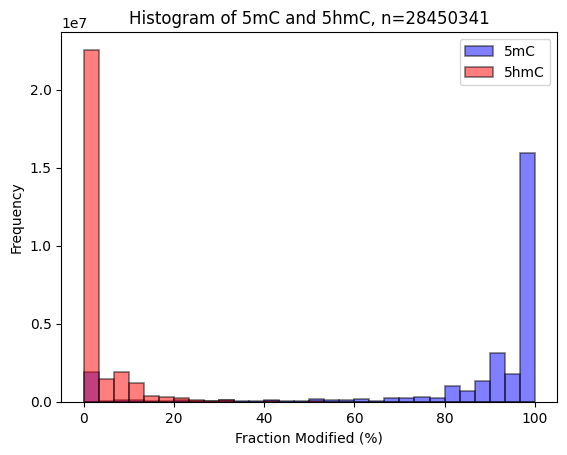

In [2]:
import matplotlib.pyplot as plt

# Create histogram for fraction_modified
plt.hist(df_5mc['fraction_modified'], bins=30, edgecolor='black', linewidth=1.2, color='blue', alpha=0.5, label='5mC')
plt.hist(df_5hmc['fraction_modified'], bins=30, edgecolor='black', linewidth=1.2, color='red', alpha=0.5, label='5hmC')
plt.title('Histogram of 5mC and 5hmC, n=' + str(df_5mc.shape[0]))
plt.xlabel('Fraction Modified (%)')
# plt.yscale('log') # Set y-axis to log scale
plt.ylabel('Frequency')
plt.legend()
plt.show()


### Coverage

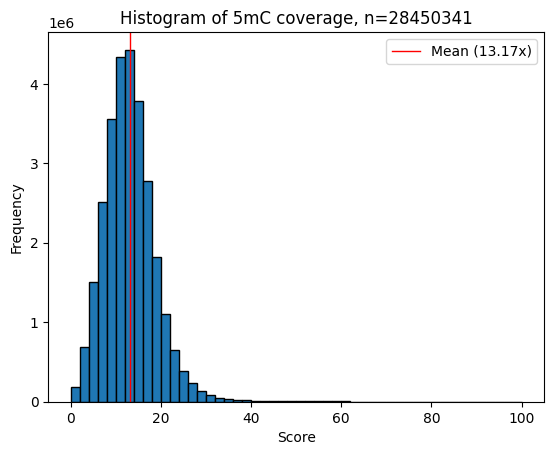

In [3]:
# create histogram of `score` for both 5mC and 5hmC, ignoring outliers
plt.hist(df_5mc['score'], bins=50, edgecolor='black', range=(0, 100))
plt.title('Histogram of 5mC coverage, n=' + str(df_5mc.shape[0]))
plt.xlabel('Score')
plt.ylabel('Frequency')
# add mean line
plt.axvline(df_5mc['score'].mean(), color='red', linewidth=1, label='Mean ('+ str(round(df_5mc['score'].mean(), 2)) + 'x)')
plt.legend()
plt.show()

### Dataset

In [4]:
df

,chrom,start_position,end_position,modified_base_code,score,strand,start_position_compat,end_position_compat,color,N_valid_cov,fraction_modified,N_mod,N_canonical,N_other_mod,N_delete,N_fail,N_diff,N_nocall
0,chr1,10468,10469,h,4,.,10468,10469,"255,0,0",4,25.00,1,0,3,0,6,0,0
1,chr1,10468,10469,m,4,.,10468,10469,"255,0,0",4,75.00,3,0,1,0,6,0,0
2,chr1,10470,10471,h,4,.,10470,10471,"255,0,0",4,25.00,1,0,3,1,4,0,1
3,chr1,10470,10471,m,4,.,10470,10471,"255,0,0",4,75.00,3,0,1,1,4,0,1
4,chr1,10483,10484,h,6,.,10483,10484,"255,0,0",6,0.00,0,0,6,4,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56900677,chrY,56887399,56887400,m,7,.,56887399,56887400,"255,0,0",7,100.00,7,0,0,0,3,0,0
56900678,chrY,56887579,56887580,h,6,.,56887579,56887580,"255,0,0",6,0.00,0,0,6,0,3,0,0
56900679,chrY,56887579,56887580,m,6,.,56887579,56887580,"255,0,0",6,100.00,6,0,0,0,3,0,0
56900680,chrY,56887700,56887701,h,9,.,56887700,56887701,"255,0,0",9,0.00,0,3,6,0,0,0,0


## Load CpG probe array coordinates for build 38

In [5]:
# Load the list of suboptimal probes
zhou2016_probes = pd.read_csv('../Data/UnreliableProbesList_Zhou2016/EPIC.anno.GRCh38.tsv', sep='\t')

# Copy the df_5mc dataframe to avoid SettingWithCopyWarning
df_5mc_copy = df_5mc.copy()

# Add a column with the coordinate of the probe in the copied dataframe
df_5mc_copy['coordinate'] = df_5mc_copy['chrom'].astype(str) + ':' + df_5mc_copy['start_position'].astype(str)
zhou2016_probes['coordinate'] = zhou2016_probes['chrm'].astype(str) + ':' + zhou2016_probes['start'].astype(str)

# Merge the two dataframes
df_5mc_merged = pd.merge(df_5mc_copy, zhou2016_probes[['probeID','coordinate']], on='coordinate', how='inner')

# Set the index to the probeID
df_5mc_merged = df_5mc_merged.set_index('probeID')

# Create beta values column
df_5mc_merged[sample_name] = (df_5mc_merged['fraction_modified'] / 100).round(3)

# Create a new dataframe with only the beta values
df_nanopore = df_5mc_merged[[sample_name]].T

df_nanopore


probeID,cg14817997,cg26928153,cg16269199,cg13869341,cg14008030,cg12045430,cg20826792,cg18231760,cg02404219,cg21870274,...,cg00180869,cg05964935,cg00618696,cg25363292,cg12170560,cg08890132,cg00491786,cg26559055,cg07587934,cg16855331
Kasumi1-naive,1.0,1.0,1.0,0.938,0.941,0.0,0.0,0.5,1.0,1.0,...,0.867,0.667,0.901,0.92,0.971,0.953,0.714,1.0,0.967,0.734


## Diagnostic model

### Load array data

In [6]:
import pandas as pd
import numpy as np
from source.pacmap_functions import *

input_path = '../Data/Intermediate_Files/'
output_path = '../Data/Processed_Data/'

# read df_discovery and df_validation
df_discovery = pd.read_pickle(
    input_path+'df_discovery.pkl').sort_index()

# Load clinical data
discovery_clinical_data = pd.read_csv(input_path+'discovery_clinical_data.csv',
                                      low_memory=False, index_col=0)

# Create a new dataframe to contain metadata for `df_nanopore`, which represents sample 'UF_hem_1832_PB'
validation_clinical_data = pd.DataFrame(index=df_nanopore.index)

# Adjust clinical data
discovery_clinical_data['Train Test'] = 'Discovery (train) Samples'
validation_clinical_data['Train Test'] = sample_name

discovery_clinical_data['PaCMAP Output'] = 'Patient Samples'
validation_clinical_data['PaCMAP Output'] = 'Patient Samples'

discovery_clinical_data['Batch'] = df_discovery['Batch']
validation_clinical_data['Batch'] = 'Nanopore'

# add the following columns to `validation_clinical_data`: 'Clinical Trial', 'Sample Type', 'Patient_ID', 'ELN AML 2022 Diagnosis', 'Hematopoietic Lineage'
validation_clinical_data['Clinical Trial'] = 'UF Hem Bank'
validation_clinical_data['Sample Type'] = 'Peripheral Blood'
validation_clinical_data['Patient_ID'] = sample_name
validation_clinical_data['ELN AML 2022 Diagnosis'] = np.nan
validation_clinical_data['Hematopoietic Lineage'] = np.nan


### Select CpGs in both train and nanopore sample

In [7]:
# use overlapping features between df_discovery and df_nanopore
common_features = [x for x in df_discovery.columns if x in df_nanopore.columns]

# apply `common_features` to both df_discovery and df_nanopore
df_discovery = df_discovery[common_features]
df_nanopore = df_nanopore[common_features]

print(
f' Discovery dataset (df_discovery) contains {df_discovery.shape[1]} \
columns (5mC nucleotides/probes) and {df_discovery.shape[0]} rows (samples).')

print(
f' Validation dataset (df_nanopore) contains {df_nanopore.shape[1]} \
columns (5mC nucleotides/probes) and {df_nanopore.shape[0]} rows (samples).')

output_notebook()
df_validation = df_nanopore.copy()

# Set the theme for the plot
curdoc().theme = 'light_minimal' # or 'dark_minimal'

 Discovery dataset (df_discovery) contains 332092 columns (5mC nucleotides/probes) and 3330 rows (samples).
 Validation dataset (df_nanopore) contains 332092 columns (5mC nucleotides/probes) and 1 rows (samples).


Loading BokehJS ...

In [8]:
clinical_trials = ['AAML0531', 'AAML1031', 'AAML03P1', 'CCG2961', 'Japanese AML05']

sample_types = ['Diagnosis', 'Primary Blood Derived Cancer - Bone Marrow', 'Bone Marrow Normal',
                'Primary Blood Derived Cancer - Peripheral Blood', 'Blood Derived Normal']

cols = ['Clinical Trial', 'Sample Type', 'Patient_ID', 'ELN AML 2022 Diagnosis', 'Train Test', 'Batch']

components = [2]
for n in components:
    processor = DataProcessor(discovery_clinical_data.copy(),
                              df_discovery,
                              clinical_trials,
                              sample_types,
                              cols, 
                              n_components=n,
                              common_prefix=output_path+f'pacmap_output/pacmap_{n}d_model_peds_dx_aml', 
                              df_test=df_validation.copy(),
                              test_clinical_data=validation_clinical_data.copy())
    
    processor.filter_data()
    processor.apply_pacmap() # learn PaCMAP on the training data
    processor.apply_pacmap_test() # apply PaCMAP to the test data
    processor.join_labels() # join clinical data to the embedding

df = processor.df.copy()

#     # Save output
#     processor.df.to_csv(output_path+f'pacmap_output/pacmap_{n}d_model_peds_dx_aml.csv')

The PaCMAP instance is successfully saved at ../Data/Processed_Data/pacmap_output/pacmap_2d_model_peds_dx_aml.pkl.
To load the instance again, please do `pacmap.load(../Data/Processed_Data/pacmap_output/pacmap_2d_model_peds_dx_aml)`.


### Visualize sample in acute leukemia atlas

In [9]:
# Concatenate discovery and validation clinical data
clinical_data = pd.concat([discovery_clinical_data, validation_clinical_data]).loc[df['index']]

# Select columns to plot
cols = ['PaCMAP Output','Hematopoietic Lineage','WHO AML 2022 Diagnosis','ELN AML 2022 Diagnosis', 'FAB', 'FLT3 ITD', 'Age (group years)',
        'Complex Karyotype', 'Primary Cytogenetic Code' ,'Batch', 'Sex', 'MRD 1 Status',
        'Leucocyte counts (10⁹/L)', 'Risk Group', 'Race or ethnic group',
        'Clinical Trial', 'Vital Status','First Event','Sample Type', 'Train Test']

# Join clinical data to the embedding
df = df.join(clinical_data[cols], rsuffix='_copy', on='index')

plotter = BokehPlotter(df, cols, get_custom_color_palette(),
                       title='The Methylome Atlas of Pediatric AML',
                        x_range=(-45, 45), y_range=(-45, 45),
                        datapoint_size=3, tooltip_dx_cols='ELN AML 2022 Diagnosis',
                        width=1000, height=500)
plotter.plot()

## Prognostic model

### Start by selecting the array-harmonized dataset

In [20]:
import pandas as pd
from source.cox_lasso_functions import *

input_path = '../Data/Intermediate_Files/'
output_path = '../Data/Processed_Data/'

raw_coefs = pd.read_csv(output_path + 'multivariate_cox_lasso/ewas_cog_os_raw_coefs.csv', index_col=0)
mean_coefs = set_cutoff(coefs=raw_coefs,threshold=0.99)

df_validation = df_nanopore[mean_coefs.index]

print(
    f' Dataset (df) contains {df_validation.shape[1]} columns (5mC nucleotides/probes) and {df_validation.shape[0]} rows (samples).')

df_validation

 Dataset (df) contains 35 columns (5mC nucleotides/probes) and 1 rows (samples).


probeID,cg22855993,cg17099306,cg10089193,cg22162847,cg09890699,cg08329113,cg18072388,cg00920892,cg19706516,cg17669009,...,cg21637653,cg26223555,cg17632028,cg06748884,cg26846864,cg04839706,cg23875404,cg16424082,cg06339275,cg02918093
Kasumi1-naive,1.0,0.4,0.111,0.4,0.583,0.692,0.9,0.546,1.0,0.125,...,1.0,1.0,1.0,1.0,0.692,1.0,1.0,1.0,0.357,0.875


## Transform to M-values

In [21]:
import math
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

# change values of 1 to 0.999 and 0 to 0.001
df_validation_transformed = df_validation.replace(1, 0.999).replace(0, 0.001)
df_validation_transformed

def beta2m(val):
    '''Transfrom beta-values into m-values'''
    return math.log2(val/(1-val))

x_test_m = df_validation_transformed.apply(np.vectorize(beta2m))

## Standardize Data

In [22]:
def standardize_data(df, reference_df):
    """Standardize data using mean and standard deviation of reference dataset"""

    # Keep only columns that are in both datasets
    reference_df = reference_df.loc[:, df.columns]

    # Standardize data
    df_z = (df - reference_df.mean()) / reference_df.std()

    return df_z

# Read top CpGs selected from previous code file (univariate cox-ph EWAS)
ewas_top_cpgs = pd.read_csv(output_path+'ewas_dmr/ewas_top_cpgs.csv', index_col=0)

# Standardize data
x_test_m_z = standardize_data(df= x_test_m, reference_df= ewas_top_cpgs)

### Generate model results

In [23]:
score_name = 'MethylScoreAML_Px'

df_test, threshold = generate_coxph_score(coef_mean=mean_coefs,
                                        x=x_test_m_z,
                                        df=df_validation_transformed,
                                        score_name=score_name,
                                        train_test=0.2208,
                                        rpart_outcome='os.time')

df_validation_transformed[['MethylScoreAML_Px','MethylScoreAML_Px Categorical']]


Continuous score cut at the value of 0.2208


probeID,MethylScoreAML_Px,MethylScoreAML_Px Categorical
Kasumi1-naive,-1.084246,Low
